#Import Libraries

In [1]:
! pip install --upgrade albumentations

     |████████████████████████████████| 98 kB 3.4 MB/s 
     |████████████████████████████████| 37.1 MB 45 kB/s 
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
import numpy as np
import os
import re
import random
from tqdm import tqdm
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array

import argparse
import time


# Import Dataset

In [3]:
!unzip -uq "/content/images.zip" -d "/content/dataset/images"

In [4]:
train_df = pd.read_csv('/content/dataset/data/train_labels.csv')
test_df= pd.read_csv('/content/dataset/data/test_labels.csv')

In [5]:
train_df.tail()

,filename,width,height,class,xmin,ymin,xmax,ymax
1006,1200.jpeg,224,224,glass_shatter,9,22,174,134
1007,1201.jpeg,224,224,tail_lamp,30,29,166,180
1008,1203.jpeg,224,224,door_dent,17,44,108,138
1009,1205.jpeg,224,224,door_dent,80,64,191,157
1010,1206.jpeg,224,224,unknown,18,42,173,172


# EDA

In [6]:
print('Total images in train: ',train_df.shape[0])
print('Total images in test: ',test_df.shape[0])

Total images in train:  1011
Total images in test:  282


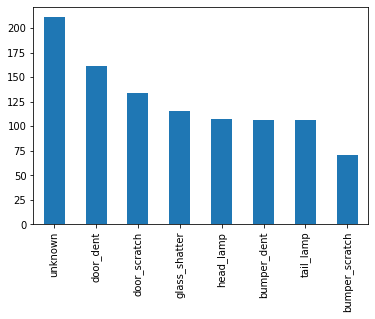

In [7]:
pd.value_counts(train_df['class']).plot.bar()

Majority of the data belongs to unknown class with more than 200 images whereas the number of images in bumper_scratch is minimum with around 75 images. Hence, the classes are imbalanced.

#Image Visualizations

In [8]:
def img_plot(path,x,y,w,h):
  img=plt.imread(str(path))
  fig, ax = plt.subplots(figsize = (6,9))
  ax.xaxis.tick_top()
  ax.imshow(img)
  ax.add_patch(patches.Rectangle((x,y),w,h, fill=False, edgecolor='red', lw=2))

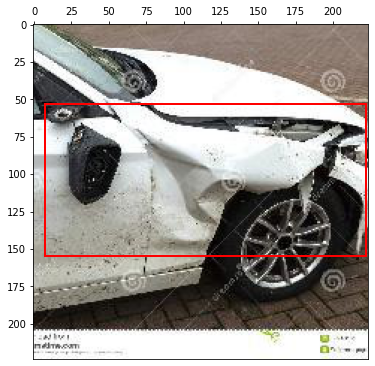

In [9]:
x=train_df[train_df['class']=='unknown'].reset_index()['xmin'][2]
y=train_df[train_df['class']=='unknown'].reset_index()['ymin'][2]
w=train_df[train_df['class']=='unknown'].reset_index()['xmax'][2]-x
h=train_df[train_df['class']=='unknown'].reset_index()['ymax'][2]-y
img_plot(str('/content/dataset/images/train/'+train_df[train_df['class']=='unknown'].reset_index()['filename'][2]),x,y,w,h)

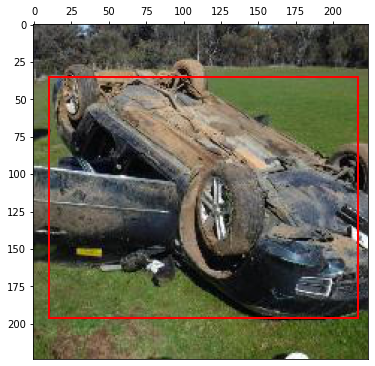

In [10]:
x=train_df[train_df['class']=='unknown'].reset_index()['xmin'][3]
y=train_df[train_df['class']=='unknown'].reset_index()['ymin'][3]
w=train_df[train_df['class']=='unknown'].reset_index()['xmax'][3]-x
h=train_df[train_df['class']=='unknown'].reset_index()['ymax'][3]-y
img_plot(str('/content/dataset/images/train/'+train_df[train_df['class']=='unknown'].reset_index()['filename'][3]),x,y,w,h)

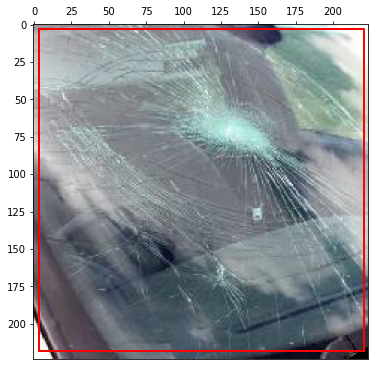

In [11]:
x=train_df[train_df['class']=='glass_shatter'].reset_index()['xmin'][5]
y=train_df[train_df['class']=='glass_shatter'].reset_index()['ymin'][5]
w=train_df[train_df['class']=='glass_shatter'].reset_index()['xmax'][5]-x
h=train_df[train_df['class']=='glass_shatter'].reset_index()['ymax'][5]-y
img_plot(str('/content/dataset/images/train/'+train_df[train_df['class']=='glass_shatter'].reset_index()['filename'][5]),x,y,w,h)

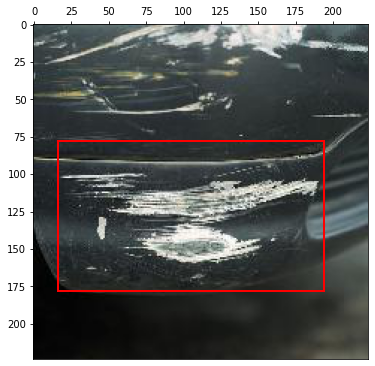

In [12]:
x=train_df[train_df['class']=='bumper_scratch'].reset_index()['xmin'][5]
y=train_df[train_df['class']=='bumper_scratch'].reset_index()['ymin'][5]
w=train_df[train_df['class']=='bumper_scratch'].reset_index()['xmax'][5]-x
h=train_df[train_df['class']=='bumper_scratch'].reset_index()['ymax'][5]-y
img_plot(str('/content/dataset/images/train/'+train_df[train_df['class']=='bumper_scratch'].reset_index()['filename'][5]),x,y,w,h)

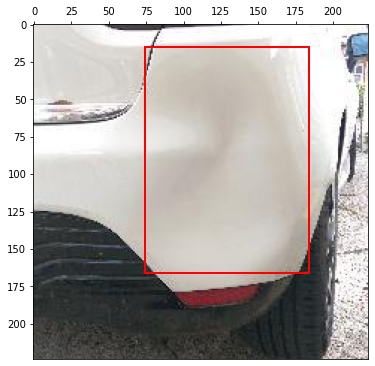

In [13]:
x=train_df[train_df['class']=='bumper_dent'].reset_index()['xmin'][1]
y=train_df[train_df['class']=='bumper_dent'].reset_index()['ymin'][1]
w=train_df[train_df['class']=='bumper_dent'].reset_index()['xmax'][1]-x
h=train_df[train_df['class']=='bumper_dent'].reset_index()['ymax'][1]-y
img_plot(str('/content/dataset/images/train/'+train_df[train_df['class']=='bumper_dent'].reset_index()['filename'][1]),x,y,w,h)

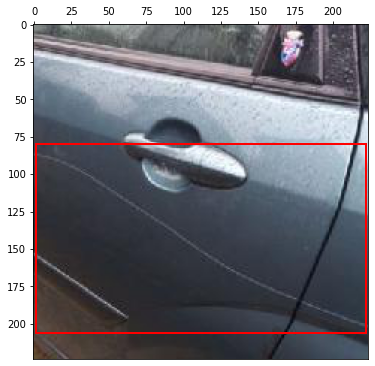

In [14]:
x=train_df[train_df['class']=='door_scratch'].reset_index()['xmin'][1]
y=train_df[train_df['class']=='door_scratch'].reset_index()['ymin'][1]
w=train_df[train_df['class']=='door_scratch'].reset_index()['xmax'][1]-x
h=train_df[train_df['class']=='door_scratch'].reset_index()['ymax'][1]-y
img_plot(str('/content/dataset/images/train/'+train_df[train_df['class']=='door_scratch'].reset_index()['filename'][1]),x,y,w,h)

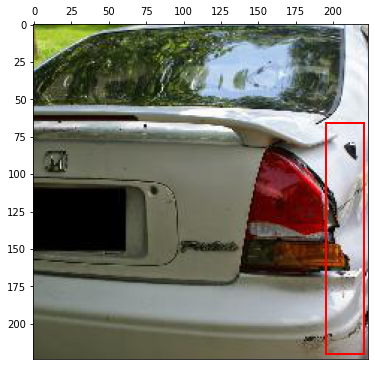

In [15]:
x=train_df[train_df['class']=='tail_lamp'].reset_index()['xmin'][2]
y=train_df[train_df['class']=='tail_lamp'].reset_index()['ymin'][2]
w=train_df[train_df['class']=='tail_lamp'].reset_index()['xmax'][2]-x
h=train_df[train_df['class']=='tail_lamp'].reset_index()['ymax'][2]-y
img_plot(str('/content/dataset/images/train/'+train_df[train_df['class']=='tail_lamp'].reset_index()['filename'][2]),x,y,w,h)

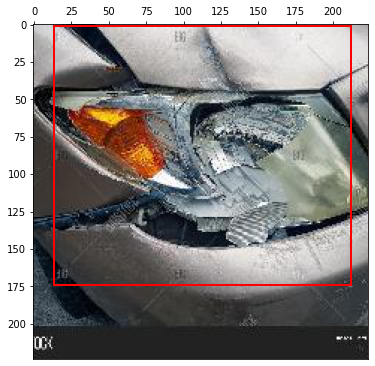

In [16]:
x=train_df[train_df['class']=='head_lamp'].reset_index()['xmin'][2]
y=train_df[train_df['class']=='head_lamp'].reset_index()['ymin'][2]
w=train_df[train_df['class']=='head_lamp'].reset_index()['xmax'][2]-x
h=train_df[train_df['class']=='head_lamp'].reset_index()['ymax'][2]-y
img_plot(str('/content/dataset/images/train/'+train_df[train_df['class']=='head_lamp'].reset_index()['filename'][2]),x,y,w,h)

Looking at the images of unknown damage, glass shatter and door scratch it is evident that the area of damage is not a significant sign of the severity of the damage.

# XML to CSV

In [ ]:
%cd /content/dataset
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET
# the xml files have been parsed once
"""
def xml_to_csv(path,df):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
      print(xml_file)
      tree = ET.parse(xml_file)
      root = tree.getroot()
      for member in root.findall('object'):
          value = (root.find('filename').text,
                   int(root.find('size')[0].text),
                   int(root.find('size')[1].text),
                   list(str(df[df['image']=='image/'+root.find('filename').text]['class']).replace('    ',' ').replace('\n',' ').split(' '))[1],
                   int(member[4][0].text),
                   int(member[4][1].text),
                   int(member[4][2].text),
                   int(member[4][3].text)
                   )
          xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df


df = pd.read_csv('/content/index.csv')
for directory in ['train','test']:
  image_path = os.path.join(os.getcwd(), 'images/{}'.format(directory))
  xml_df = xml_to_csv(image_path, df)
  xml_df.to_csv('data/{}_labels.csv'.format(directory), index=None)
  print('Successfully converted xml to csv.')
"""

# Data Augmentation

In [18]:
import albumentations as A #For augmentation of images and corresponding bounding boxes

In [ ]:
image = cv2.imread("/content/dataset/images/train/0.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
xmin=list(train_df[train_df['filename']=='0.jpeg']['xmin'])
xmax=list(train_df[train_df['filename']=='0.jpeg']['xmax'])
ymin=list(train_df[train_df['filename']=='0.jpeg']['ymin'])
ymax=list(train_df[train_df['filename']=='0.jpeg']['ymax'])
class_labels=list(train_df[train_df['filename']=='0.jpeg']['class'])
xmin.extend(ymin)
xmin.extend(xmax)
xmin.extend(ymax)
xmin.extend(class_labels)
bboxes=[xmin]

In [20]:
transform = A.Compose([
    A.RandomCrop(width=224, height=224),
    A.HorizontalFlip(p=0.5),
    A.GaussianBlur(blur_limit=(3, 7), sigma_limit=0, always_apply=False, p=0.5),
    A.RandomBrightnessContrast(p=0.4),
], bbox_params=A.BboxParams(format='pascal_voc'))

In [21]:
transformed = transform(image=image, bboxes=bboxes)

transformed_image = transformed["image"]
transformed_bboxes = transformed["bboxes"]

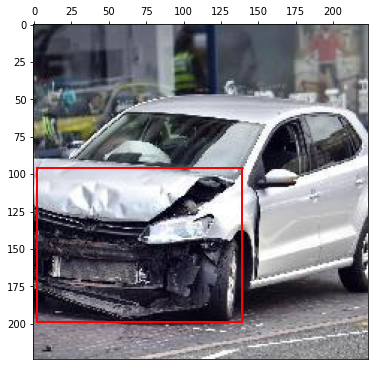

In [22]:
fig, ax = plt.subplots(figsize = (6,9))
ax.xaxis.tick_top()
ax.imshow(transformed_image)
x = transformed_bboxes[0][0]
y = transformed_bboxes[0][1]
w = transformed_bboxes[0][2]-transformed_bboxes[0][0]
h = transformed_bboxes[0][3]-transformed_bboxes[0][1]
ax.add_patch(patches.Rectangle((x,y),w,h, fill=False, edgecolor='red', lw=2))

Augmented image

In [23]:
max_count=211
count=0
aug_df=pd.DataFrame(data=None,columns=train_df.columns)
for classes in list(train_df['class'].unique()):
  if (len(train_df[train_df['class']==classes])<211):
    for x in range (0,max_count-len(train_df[train_df['class']==classes])):
      try:
        image = cv2.imread("/content/dataset/images/train/"+list(train_df[train_df['class']==classes]['filename'])[x])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        xmin=[list(train_df[train_df['class']==classes]['xmin'])[x]]
        xmax=[list(train_df[train_df['class']==classes]['xmax'])[x]]
        ymin=[list(train_df[train_df['class']==classes]['ymin'])[x]]
        ymax=[list(train_df[train_df['class']==classes]['ymax'])[x]]
        class_labels=[list(train_df[train_df['class']==classes]['class'])[x]]
        xmin.extend(ymin)
        xmin.extend(xmax)
        xmin.extend(ymax)
        xmin.extend(class_labels)
        bboxes=[xmin]
        transformed = transform(image=image, bboxes=bboxes)
        transformed_image = transformed["image"]
        transformed_bboxes = transformed["bboxes"]
        cv2.imwrite('/content/dataset/images/train/'+'aug_'+str(count)+'.jpeg',transformed_image)
        data={
            'filename': ['aug_'+str(count)+'.jpeg'],
            'width':[224],
            'height':[224],
            'class': [transformed_bboxes[0][4]],
            'xmin' : [transformed_bboxes[0][0]],
            'ymin' : [transformed_bboxes[0][1]],
            'xmax' : [transformed_bboxes[0][2]],
            'ymax' : [transformed_bboxes[0][3]]
        }
        df_dict = pd.DataFrame(data)
        aug_df = aug_df.append(df_dict,ignore_index=True)
        
      except IndexError:
        image = cv2.imread("/content/dataset/images/train/"+list(train_df[train_df['class']==classes]['filename'])[x-len(train_df[train_df['class']==classes])])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        xmin=[list(train_df[train_df['class']==classes]['xmin'])[x-len(train_df[train_df['class']==classes])]]
        xmax=[list(train_df[train_df['class']==classes]['xmax'])[x-len(train_df[train_df['class']==classes])]]
        ymin=[list(train_df[train_df['class']==classes]['ymin'])[x-len(train_df[train_df['class']==classes])]]
        ymax=[list(train_df[train_df['class']==classes]['ymax'])[x-len(train_df[train_df['class']==classes])]]
        class_labels=[list(train_df[train_df['class']==classes]['class'])[x-len(train_df[train_df['class']==classes])]]
        xmin.extend(ymin)
        xmin.extend(xmax)
        xmin.extend(ymax)
        xmin.extend(class_labels)
        bboxes=[xmin]
        transformed = transform(image=image, bboxes=bboxes)
        transformed_image = transformed["image"]
        transformed_bboxes = transformed["bboxes"]
        cv2.imwrite('/content/dataset/images/train/'+'aug_'+str(count)+'.jpeg',transformed_image)
        data={
            'filename': ['aug_'+str(count)+'.jpeg'],
            'width':[224],
            'height':[224],
            'class': [transformed_bboxes[0][4]],
            'xmin' : [transformed_bboxes[0][0]],
            'ymin' : [transformed_bboxes[0][1]],
            'xmax' : [transformed_bboxes[0][2]],
            'ymax' : [transformed_bboxes[0][3]]
        }
        df_dict = pd.DataFrame(data)
        aug_df = aug_df.append(df_dict,ignore_index=True)

      count=count+1


In [24]:
aug_df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,aug_0.jpeg,224,224,head_lamp,92.0,37.0,214.0,183.0
1,aug_1.jpeg,224,224,head_lamp,68.0,14.0,206.0,176.0
2,aug_2.jpeg,224,224,head_lamp,13.0,1.0,212.0,174.0
3,aug_3.jpeg,224,224,head_lamp,12.0,32.0,212.0,220.0
4,aug_4.jpeg,224,224,head_lamp,30.0,81.0,117.0,179.0


Appending augmented data to original dataset

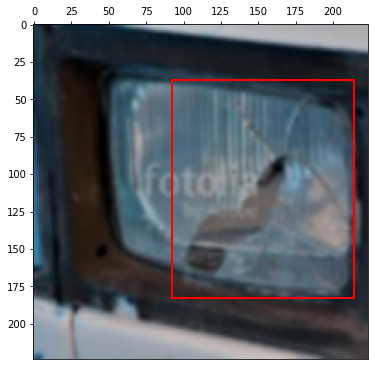

In [25]:
img_plot('/content/dataset/images/train/aug_0.jpeg',aug_df['xmin'][0],aug_df['ymin'][0],aug_df['xmax'][0]-aug_df['xmin'][0],aug_df['ymax'][0]-aug_df['ymin'][0])

In [26]:
train_df = train_df.append(aug_df,ignore_index=True)

In [27]:
train_df.shape

(1688, 8)

In [28]:
train_df['class'].value_counts()

door_dent         211
head_lamp         211
bumper_scratch    211
unknown           211
glass_shatter     211
bumper_dent       211
door_scratch      211
tail_lamp         211
Name: class, dtype: int64

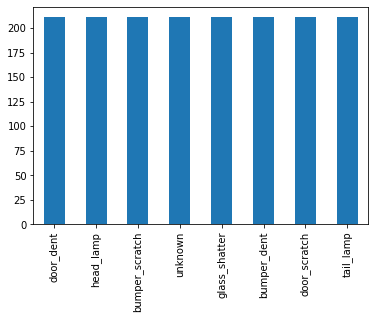

In [29]:
pd.value_counts(train_df['class']).plot.bar()

The classes have been balanced using data augmentation.

In [30]:
train_df.to_csv('/content/dataset/data/train_labels.csv',index=False)

# Object Detection

In [31]:
import os
import pathlib

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2922, done.
remote: Counting objects: 100% (2922/2922), done.
remote: Compressing objects: 100% (2457/2457), done.
remote: Total 2922 (delta 741), reused 1247 (delta 427), pack-reused 0
Receiving objects: 100% (2922/2922), 32.98 MiB | 26.76 MiB/s, done.
Resolving deltas: 100% (741/741), done.


In [32]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/dataset/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1665976 sha256=093762d3d8c49ae202616a340e63c52c5907cd3b8d80c02f6577f8265057c8d8
  Stored in directory: /tmp/pip-ephem-wheel-cache-arz5hvu_/wheels/5f/33/2b/5f330064339e2743f483b9fbfc53364d9ae0a97b59dbf7535d
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22258 sha256=9e74a2de68b5a8dadfa27160d08b11ec47b995f60cfbfc88c7519c39cb5f6c3b
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for avro-python3: filename=avro_python3-1.9.2.1-py3-none-any.whl size=43512 sha256=1aa3b667a73550d1ffd79fa3c17ac5e886da4566e02ed517f3ee537489e2628c
  Stored in directory: /root/.cache/pip/wheels/bc/49/5f/fdb5b9d85055c478213e0158ac122b596816149a02d82e0ab1
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78546 sha256=5a481bad7c3a48d041582fec32c7e8de82fda5db5

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.12.2 requires dill>=0.3.4, but you have dill 0.3.1.1 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [33]:
#Convert CSV files to tfrecord files
%cd /content/dataset

!python /content/generate_tfrecord.py --csv_input=data/train_labels.csv  --output_path=data/train.record --image_dir=images/train

!python /content/generate_tfrecord.py --csv_input=data/test_labels.csv  --output_path=data/test.record --image_dir=images/test

/content/dataset
2021-09-28 13:06:53.333800: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 13:06:53.794001: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 13:06:53.794975: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
Successfully created the TFRecords: /content/dataset/data/train.record
2021-09-28 13:06:59.046836: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 13:06:59.057027: I te

In [34]:
test_record_fname = '/content/dataset/data/test.record'
train_record_fname = '/content/dataset/data/train.record'
label_map_pbtxt_fname = '/content/dataset/label_map.pbtxt'

In [35]:
MODELS_CONFIG = {
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
        'batch_size': 8
    },
    'efficientdet-d1': {
        'model_name': 'efficientdet_d1_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d1_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d1_coco17_tpu-32.tar.gz',
        'batch_size': 8
    },
    'efficientdet-d2': {
        'model_name': 'efficientdet_d2_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d2_768x768_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d2_coco17_tpu-32.tar.gz',
        'batch_size': 8
    },
        'efficientdet-d3': {
        'model_name': 'efficientdet_d3_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d3_896x896_coco17_tpu-32.config',
        'pretrained_checkpoint': 'efficientdet_d3_coco17_tpu-32.tar.gz',
        'batch_size': 8
    }
}

chosen_model = 'efficientdet-d0' #For better performance higher models could be used but due to RAM limitations only d0 variant was used in this project

num_steps = 10000 #Increasing steps gives higher accuracy however the time taken is very high
num_eval_steps = 500

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size']

In [36]:
%mkdir /content/dataset/models/research/deploy/
%cd /content/dataset/models/research/deploy/
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

/content/dataset/models/research/deploy
--2021-09-28 13:06:59--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.124.128, 2607:f8b0:4001:c14::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.124.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M  --.-KB/s    in 0.1s    

2021-09-28 13:07:00 (207 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



In [37]:
%cd /content/dataset/models/research/deploy/
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/dataset/models/research/deploy
--2021-09-28 13:07:00--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’

ssd_efficientdet_d0 100%[===================>]   4.52K  --.-KB/s    in 0s      

2021-09-28 13:07:00 (44.9 MB/s) - ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’ saved [4630/4630]



In [38]:
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder
pipeline_fname = '/content/dataset/models/research/deploy/' + base_pipeline_file
fine_tune_checkpoint = '/content/dataset/models/research/deploy/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)


Fine tuning the model configuration file

In [39]:
import re

%cd /content/dataset/models/research/deploy/
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:
   
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)
        
    f.write(s)

/content/dataset/models/research/deploy
writing custom configuration file


In [40]:
%cat /content/dataset/models/research/deploy/pipeline_file.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 8
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      m

In [41]:
pipeline_file = '/content/dataset/models/research/deploy/pipeline_file.config'
model_dir = 'training/'
!rm -rf {model_dir}
os.makedirs(model_dir, exist_ok=True)

In [42]:
!python /content/dataset/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2021-09-28 13:07:05.107812: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 13:07:05.118729: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 13:07:05.119624: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 13:07:05.121682: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 13:07:05.122548: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

In [43]:
%load_ext tensorboard
%tensorboard --logdir '/content/dataset/models/research/deploy/training'

<IPython.core.display.Javascript object>

In [45]:
def load_image_into_numpy_array(path):
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [46]:
%ls '/content/dataset/models/research/deploy/training'

checkpoint                   ckpt-7.data-00000-of-00001
ckpt-10.data-00000-of-00001  ckpt-7.index
ckpt-10.index                ckpt-8.data-00000-of-00001
ckpt-11.data-00000-of-00001  ckpt-8.index
ckpt-11.index                ckpt-9.data-00000-of-00001
ckpt-5.data-00000-of-00001   ckpt-9.index
ckpt-5.index                 eval/
ckpt-6.data-00000-of-00001   train/
ckpt-6.index


In [47]:
import re
import numpy as np
output_directory = '/training'
!python /content/dataset/models/research/object_detection/exporter_main_v2.py \
--trained_checkpoint_dir {model_dir} \
--output_directory {output_directory} \
--pipeline_config_path {pipeline_file}

2021-09-28 16:08:41.435118: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 16:08:41.447308: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 16:08:41.448217: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 16:08:41.458366: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-28 16:08:41.459257: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

In [48]:
!ls {output_directory}

checkpoint  pipeline.config  saved_model


In [50]:
%ls '/training/saved_model/'

assets/  saved_model.pb  variables/


# Prediction on test data

In [51]:
import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline

In [77]:
import pathlib

filenames = list(pathlib.Path('/content/dataset/models/research/deploy/training/').glob('*.index'))

filenames.sort()
print(filenames)

pipeline_config = pipeline_file
model_dir = str(filenames[-1]).replace('.index','')
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace('.index','')))


def get_model_detection_function(model):
  @tf.function
  def detect_fn(image):
    image, shapes = model.preprocess(image)
    start_time = time.time()
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)
    end_time = time.time()
    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

[PosixPath('/content/dataset/models/research/deploy/training/ckpt-10.index'), PosixPath('/content/dataset/models/research/deploy/training/ckpt-11.index'), PosixPath('/content/dataset/models/research/deploy/training/ckpt-5.index'), PosixPath('/content/dataset/models/research/deploy/training/ckpt-6.index'), PosixPath('/content/dataset/models/research/deploy/training/ckpt-7.index'), PosixPath('/content/dataset/models/research/deploy/training/ckpt-8.index'), PosixPath('/content/dataset/models/research/deploy/training/ckpt-9.index')]


In [78]:
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

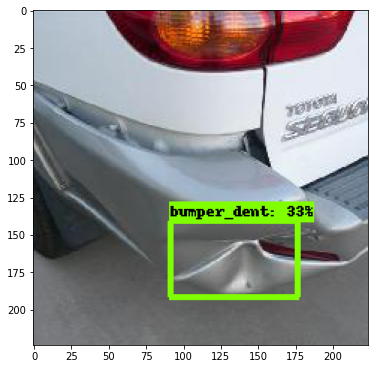

In [104]:
import random

TEST_IMAGE_PATHS = glob.glob('/content/dataset/images/test/*.jpeg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)


input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=1,
      min_score_thresh=0.2,
      agnostic_mode=False,
)

plt.figure(figsize=(6,8))
plt.imshow(image_np_with_detections)
plt.show()

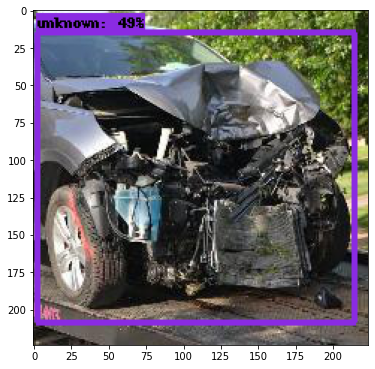

In [105]:
import random

TEST_IMAGE_PATHS = glob.glob('/content/dataset/images/test/*.jpeg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes= detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=1,
      min_score_thresh=0.2,
      agnostic_mode=False,
)

plt.figure(figsize=(6,8))
plt.imshow(image_np_with_detections)
plt.show()

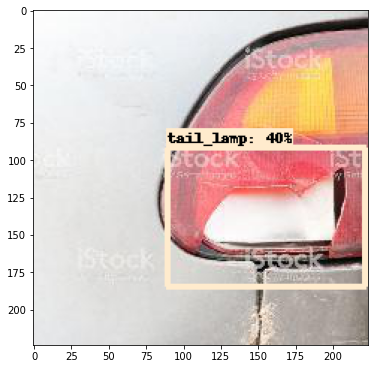

In [108]:
TEST_IMAGE_PATHS = glob.glob('/content/dataset/images/test/*.jpeg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)


input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=1,
      min_score_thresh=0.2,
      agnostic_mode=False,
)

plt.figure(figsize=(6,8))
plt.imshow(image_np_with_detections)
plt.show()

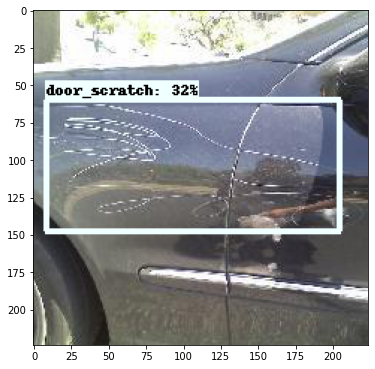

In [109]:
TEST_IMAGE_PATHS = glob.glob('/content/dataset/images/test/*.jpeg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=1,
      min_score_thresh=0.2,
      agnostic_mode=False,
)

plt.figure(figsize=(6,8))
plt.imshow(image_np_with_detections)
plt.show()

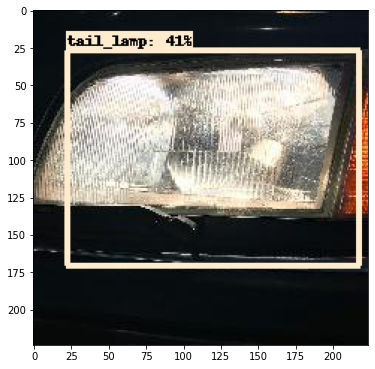

In [110]:
import random
import time

TEST_IMAGE_PATHS = glob.glob('/content/dataset/images/test/*.jpeg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=1,
      min_score_thresh=0.2,
      agnostic_mode=False,
)
plt.figure(figsize=(6,8))
plt.imshow(image_np_with_detections)
plt.show()

# Evaluation

In [97]:
TEST_IMAGE_PATHS = glob.glob('/content/dataset/images/test/*.jpeg')
elapsed_time = []
predictions = []
for image_path in TEST_IMAGE_PATHS:
  image_np = load_image_into_numpy_array(image_path)

  input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
  start_time=time.time()
  detections, predictions_dict, shapes = detect_fn(input_tensor)
  end_time=time.time()
  elapsed_time.append(end_time-start_time)
  label_id_offset = 1
  image_np_with_detections = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=1,
      min_score_thresh=0.2,
      agnostic_mode=False,
  )
  predictions.append([image_path.split('/')[-1],(detections['detection_classes'][0][0].numpy() + label_id_offset).astype(int)])
print('Latency: ',(sum(elapsed_time)/282.0)*1000,'ms')

Latency:  71.95412098093236 ms


The average latency is 71.95ms.

In [98]:
y_dict = {'bumper_dent':1, 'bumper_scratch': 2, 'door_dent': 3, 'door_scratch':4, 'glass_shatter': 5, 'head_lamp': 6, 'tail_lamp':7, 'unknown':8}
test_df['class_labels'] = np.nan

In [ ]:
for i in range (0,282):
  test_df['class_labels'][i]=y_dict[test_df['class'][i]]

In [100]:
y_test=[]
for i in range (0,237):
  y_test.append(list(test_df[test_df['filename']==predictions[i][0]]['class_labels']))

In [101]:
y_pred=[]
for x in predictions:
  y_pred.append(x[1])

In [102]:
y_known=[]
for x in range(0,237):
  y_known.append(y_test[x][0])

              precision    recall  f1-score   support

         1.0       0.63      0.85      0.72        26
         2.0       0.46      0.40      0.43        15
         3.0       0.80      0.32      0.46        37
         4.0       0.59      0.77      0.67        31
         5.0       0.68      0.70      0.69        27
         6.0       0.91      0.42      0.57        24
         7.0       0.48      0.96      0.64        26
         8.0       0.98      0.80      0.88        51

    accuracy                           0.67       237
   macro avg       0.69      0.65      0.63       237
weighted avg       0.73      0.67      0.66       237



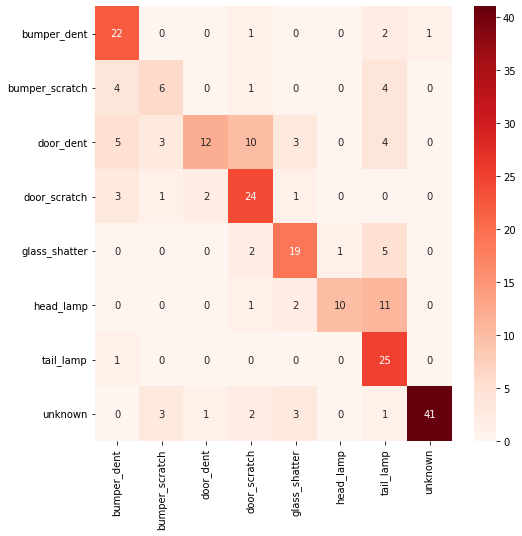

In [103]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score 
cm = confusion_matrix(y_known, y_pred)
plt.figure(figsize=(8,8))
sns.heatmap(cm, annot=True, xticklabels=y_dict.keys(), yticklabels=y_dict.keys(), cmap='Reds')
print(classification_report(y_known, y_pred))

OBSERVATIONS:

Since the ‘unknown’ class has severely damaged cars and most of the images under this class have multiple damages similar to other classes, it has been confused with other classes. However, the model has been able to classify most of these images correctly.


Images having similar type of damages such as door and bumper dents and door and bumper scratch as well as same location of damage is being confused.


# Severity

After analysing images for every category it can be seen that the images in the unknown category has the maximum amount of damage since these are categorised as ‘unknown’ due to presence of multiple damage locations.

Glass shatter and lamp damages can be classified as moderate whereas dents and scratches can be categorised as low damages.


In [ ]:
test_df['severity']=np.nan
y_dict = {1:'low', 2: 'low', 3: 'low', 4:'low', 5: 'medium', 6: 'medium', 7:'medium', 8:'high'}
for i in range (0,282):
  test_df['severity'][i]=y_dict[test_df['class_labels'][i]]

In [93]:
test_df.drop(['xmin','ymin','xmax','ymax','class_labels'],axis=1).head()

,filename,width,height,class,severity
0,1209.jpeg,224,224,bumper_dent,low
1,1210.jpeg,224,224,unknown,high
2,1213.jpeg,224,224,door_scratch,low
3,1214.jpeg,224,224,glass_shatter,medium
4,1216.jpeg,224,224,door_dent,low
